# Mini Project 

#### Import Libraries

In [1]:
# Remove warning messages 
import warnings 
warnings.filterwarnings('ignore')

> NumPy : Library for Numeric Computations in Python  
> Pandas : Library for Data Acquisition and Preparation  
> Matplotlib : Low-level library for Data Visualization  
> Seaborn : Higher-level library for Data Visualization  

In [2]:
# Basic libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

#### Import of Data

Dataset from data.gov.sg : "Resale Flat Price"  
Source: https://data.gov.sg/dataset/resale-flat-prices

The dataset is `resale-flat-prices-based-on-registration-date-from-jan-2017-onwards.csv`; thus, the `read_csv` function from Pandas is used.  
The `head` function is then used to display the first five rows of the dataset.

In [3]:
rfp_data = pd.read_csv('resale-flat-prices-based-on-registration-date-from-jan-2017-onwards.csv')

In [4]:
# Check the data types of all the variables
rfp_data.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 133773 entries, 0 to 133772
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                133773 non-null  object 
 1   town                 133773 non-null  object 
 2   flat_type            133773 non-null  object 
 3   block                133773 non-null  object 
 4   street_name          133773 non-null  object 
 5   storey_range         133773 non-null  object 
 6   floor_area_sqm       133773 non-null  float64
 7   flat_model           133773 non-null  object 
 8   lease_commence_date  133773 non-null  int64  
 9   remaining_lease      133773 non-null  object 
 10  resale_price         133773 non-null  float64
dtypes: float64(2), int64(1), object(8)
memory usage: 11.2+ MB


The table is created manually and the observations of the variables are based on our own interpretation.

| Variable            | Observation                   |    
| -------------------:| :---------------------------: |    
| month               | Time Stamp, not just numeric  |   
| town                | Categorical Variable          |
| flat_type           | Categorical Variable          |   
| block               | Categorical Variable          |   
| street_name         | Categorical Variable          |   
| storey_range        | Categorical Variable          |   
| floor_area_sqm      | Numeric Variable              |   
| flat_model          | Categorical Variable          |    
| lease_commence_date | Time Stamp, not just numeric  |    
| remaining_lease     | Time Stamp, not just numeric  |    
| resale_price        | Numeric Variable              |      

In [5]:
x = rfp_data.shape # Shows the number of columns and rows of the data
print("Number of rows:",x[0])
print("Number of columns:",x[1])

Number of rows: 133773
Number of columns: 11


In [6]:
x_dtype = type(rfp_data)
x_len = len(rfp_data)
print("Data type : ", x_dtype) #Show the class type of a variable
print("Data number of Rows : ", x_len) #Show the number of rows of a variable

Data type :  <class 'pandas.core.frame.DataFrame'>
Data number of Rows :  133773


In [7]:
# Overall summary statistics
rfp_data.describe()

,floor_area_sqm,lease_commence_date,resale_price
count,133773.000000,133773.000000,1.337730e+05
mean,97.770046,1995.320625,4.704408e+05
std,24.100414,13.598237,1.628940e+05
min,31.000000,1966.000000,1.400000e+05
25%,82.000000,1985.000000,3.500000e+05
50%,94.000000,1996.000000,4.400000e+05
75%,113.000000,2006.000000,5.550000e+05
max,249.000000,2019.000000,1.418000e+06


In [8]:
# Drop non-related variables
important_data = rfp_data.drop(['month','street_name','block'], axis = 1).reset_index(drop = True).copy() 
important_data.head() 

,town,flat_type,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,ANG MO KIO,2 ROOM,10 TO 12,44.0,Improved,1979,61 years 04 months,232000.0
1,ANG MO KIO,3 ROOM,01 TO 03,67.0,New Generation,1978,60 years 07 months,250000.0
2,ANG MO KIO,3 ROOM,01 TO 03,67.0,New Generation,1980,62 years 05 months,262000.0
3,ANG MO KIO,3 ROOM,04 TO 06,68.0,New Generation,1980,62 years 01 month,265000.0
4,ANG MO KIO,3 ROOM,01 TO 03,67.0,New Generation,1980,62 years 05 months,265000.0


---

## Part 1 - Overall Analysis of Data

In [9]:
import plotly.offline as py
import plotly.graph_objs as go
from plotly import subplots

In [10]:
# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)

In [11]:
resaleprice_obj = rfp_data["resale_price"]

# Interactive Histogram for Resale Price

trace = go.Histogram(histnorm = 'density', x = resaleprice_obj)

layout1 = go.Layout(title = 'Resale Price Distribution',
                    xaxis_title = "Resale Price",
                    yaxis_title = "Count")

fig = go.Figure(layout = layout1, data = trace)
fig.show()

In [12]:
# Interactive Boxplot
trace2 = go.Box(x = resaleprice_obj, showlegend = False, name = 'Resale Price')
layout2 = go.Layout(title = 'Interactive Boxplot')
data = [trace2]
fig_2 = go.Figure(layout = layout2, data = trace2)
fig_2.show()

In [13]:
# Summary statistics of Resale Price
ResalePrice = pd.DataFrame(rfp_data["resale_price"])
Q1 = ResalePrice.quantile(0.25) #25 percentile
Q3 = ResalePrice.quantile(0.75) #75 percentile
IQR = Q3 - Q1
count = ((ResalePrice < (Q1 - 1.5 * IQR)) | (ResalePrice > (Q3 + 1.5 * IQR))).sum() #add all the outliers
percentageoutlier=(float(count)/90123)*100

print("Minimum Price:","\t\t",np.percentile(ResalePrice, 0))
a = [25,50,75]
for i in a:
    print(i,"th Percentile:","\t",np.percentile(ResalePrice, i))
    i = i + 0.25
print("Maximum Price:","\t\t",np.percentile(ResalePrice, 100))
print("Price Skewness","\t\t", float(ResalePrice.skew().round(3))) #round is to round off the data to 3dp
print("Number of outliers:","\t",round(percentageoutlier,2),"%")

Minimum Price: 		 140000.0
25 th Percentile: 	 350000.0
50 th Percentile: 	 440000.0
75 th Percentile: 	 555000.0
Maximum Price: 		 1418000.0
Price Skewness 		 0.999
Number of outliers: 	 3.89 %


---

## Part 2 - Analysis of Numerical Data and Categorical Data

### Numerical Data

Based on the data set, the `floor_area_sqm`, `remaining_lease` and 
`lease_commence_date` are identified as numerical variables. Since `lease_commence_date` and `remaining_lease` are related, we only use `remaining_lease` for numerical analysis. 

In [14]:
# Numerical Data
important_data['remaining_lease'] = important_data['remaining_lease'].astype(str).str[:2].astype(int) # take the year of the remaining lease and treat it as a numerical variable
numericalData = pd.DataFrame(important_data[['remaining_lease','floor_area_sqm','resale_price']]) # analysise the numerical data first
numericalData.head()

,remaining_lease,floor_area_sqm,resale_price
0,61,44.0,232000.0
1,60,67.0,250000.0
2,62,67.0,262000.0
3,62,68.0,265000.0
4,62,67.0,265000.0


#### Summary Statistics of Numerical Data

In [15]:
numericalData.describe()

,remaining_lease,floor_area_sqm,resale_price
count,133773.000000,133773.000000,1.337730e+05
mean,74.360902,97.770046,4.704408e+05
std,13.525279,24.100414,1.628940e+05
min,43.000000,31.000000,1.400000e+05
25%,64.000000,82.000000,3.500000e+05
50%,74.000000,94.000000,4.400000e+05
75%,85.000000,113.000000,5.550000e+05
max,97.000000,249.000000,1.418000e+06


In [16]:
numericalData.skew()

remaining_lease    0.014855
floor_area_sqm     0.260349
resale_price       0.999005
dtype: float64

In [17]:
#Find number of outliers
for var in numericalData:
    temp = pd.DataFrame(numericalData[var])
    Q1 = temp.quantile(0.25)
    Q3 = temp.quantile(0.75)
    IQR = Q3 - Q1
    count = ((temp < (Q1 - 1.5 * IQR)) | (temp > (Q3 + 1.5 * IQR))).sum()
    print(count)

remaining_lease    0
dtype: int64
floor_area_sqm    770
dtype: int64
resale_price    3503
dtype: int64


As shown above, floor area has the maximum number of outliers. 

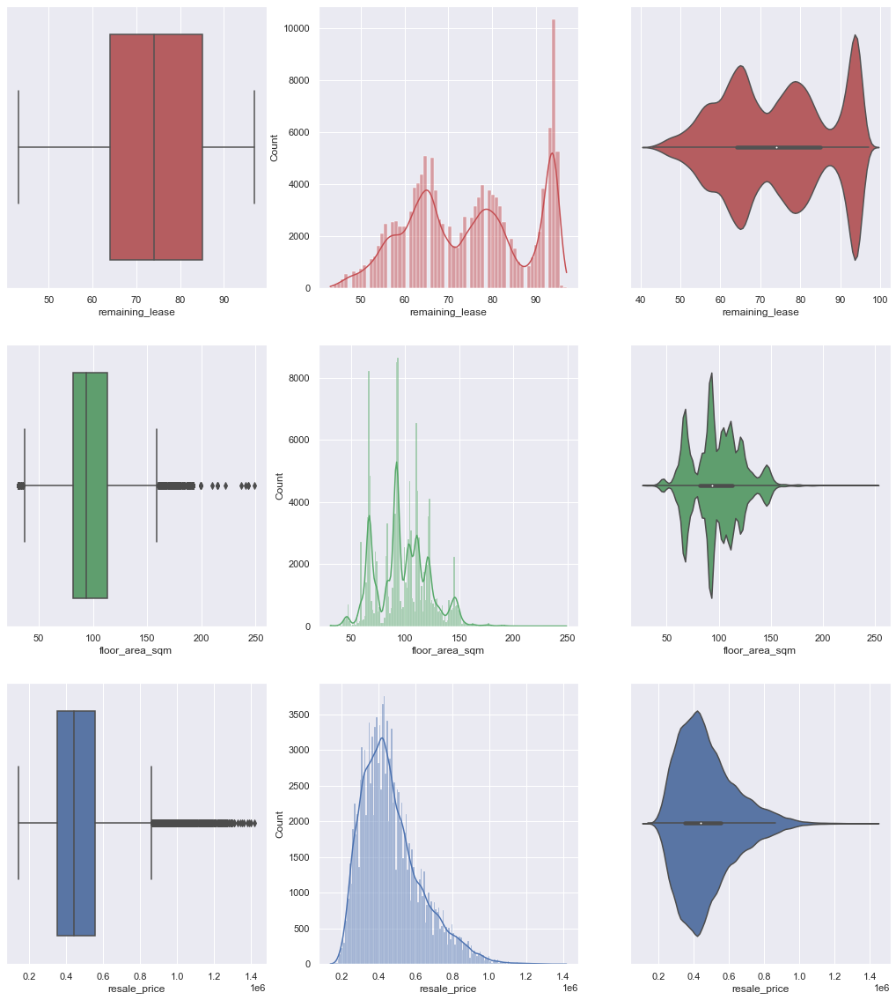

In [18]:
# Draw the distributions of all variables using FOR loop
f, axes = plt.subplots(3, 3, figsize=(18, 20))
colors = ["r", "g", "b"]  
count = 0
for var in numericalData:
    sb.boxplot(x = var, data = numericalData, color = colors[count], ax = axes[count,0])
    sb.histplot(x = var, data = numericalData, kde = True, color = colors[count], ax = axes[count,1])
    sb.violinplot(x = var, data = numericalData, color = colors[count], ax = axes[count,2])
    count += 1 # same as count = count + 1

<AxesSubplot:>

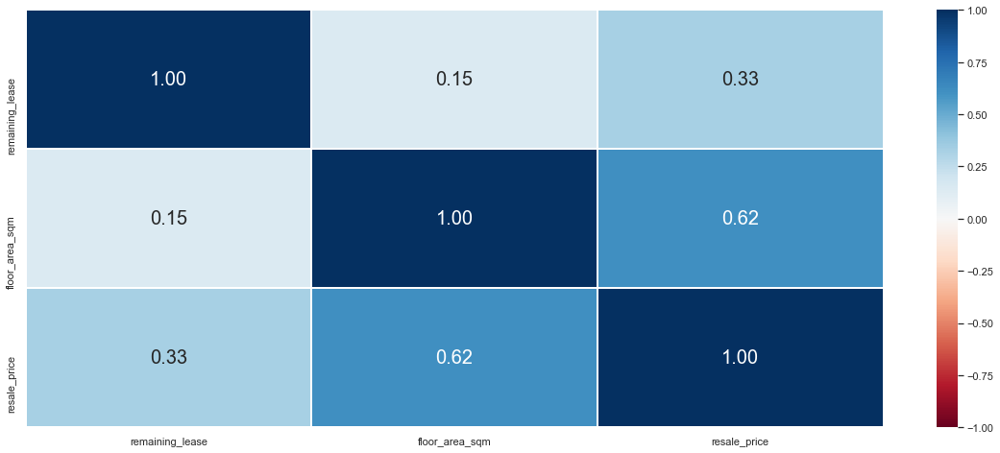

In [19]:
# To find correlation between the numerical variables
# Heatmap of correlation matrix 
plt.figure(figsize=(20, 8))
sb.heatmap(numericalData.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 20}, cmap = "RdBu") #see the dependence of variables on the resale price

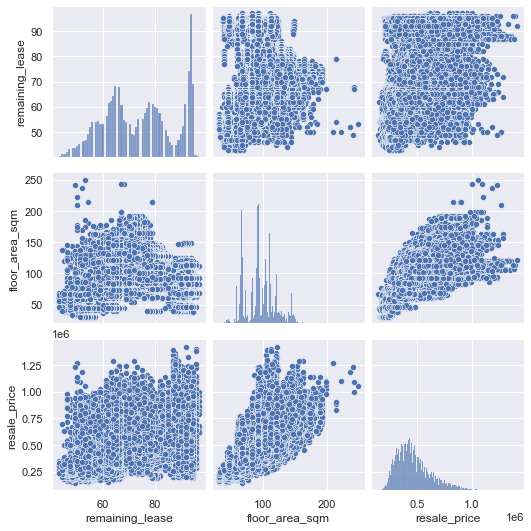

In [20]:
sb.pairplot(data = numericalData) 

**Observation**: 
Based on the heatmap, both the numerical variables show a positive correlation with `resale_price`. The correlation between `floor_area_sqm` and `resale_price` is 0.62 while the correlation between `remaining_lease` and `resale_price` is 0.34. This means that the `floor_area_sqm` has a stronger correlation and linearity with `resale_price` as compared to the `remaining_lease`.

#### Predicting Resale Price using Floor Area 

In [21]:
# Import Linear Regression model from Scikit-Learn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [22]:
# Split the dataset randomly into Train and Test 
X = pd.DataFrame(rfp_data['floor_area_sqm'])
y = pd.DataFrame(rfp_data['resale_price'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

# Check the sample sizes
print("Train Set :", X_train.shape, y_train.shape)
print("Test Set  :", X_test.shape, y_test.shape)

Train Set : (107018, 1) (107018, 1)
Test Set  : (26755, 1) (26755, 1)


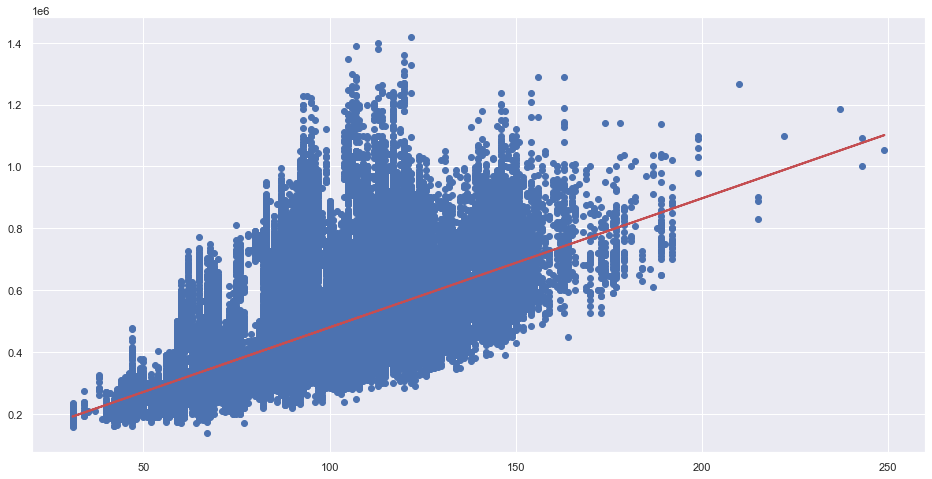

In [23]:
# Create a linear regression object
linreg = LinearRegression() 

# using train set to train model
linreg.fit(X_train, y_train) 

# using test set to test model by obtaining the predicted output via the fitted model with X_test as input
Y_pred = linreg.predict(X_test) 

# Formula for the Regression line
regline_x = X_train
regline_y = linreg.intercept_ + linreg.coef_ * regline_x

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))

# Scatter plot for floor_area_sqm_train(x-axis) vs resale_price_train (y-axis) 
plt.scatter(X_train, y_train) 

# Regression line plot from the fitting above
plt.plot(regline_x, regline_y, 'r-', linewidth = 2)


#### Prediction of Resale Price based on Floor Area

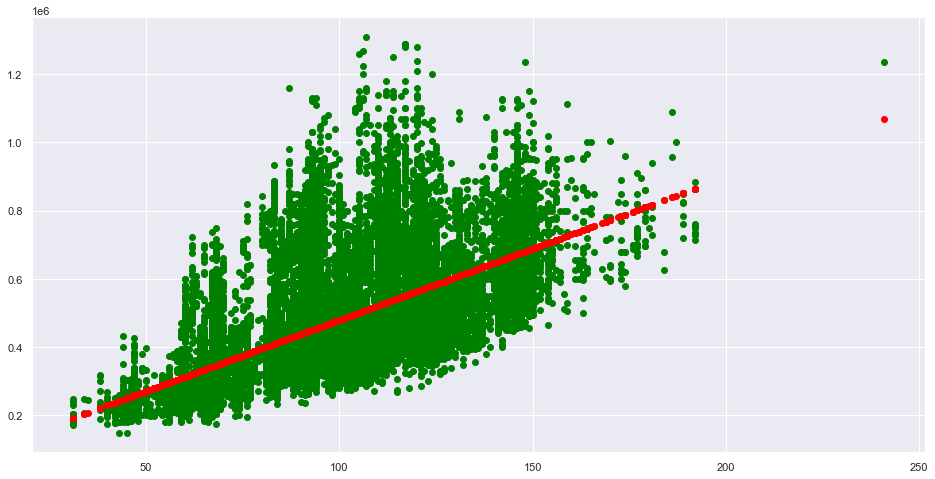

In [24]:
# Predict Resale Price values corresponding to Floor Area
y_test_pred = linreg.predict(X_test)

# Plot the Predictions
plt.figure(figsize=(16, 8))
plt.scatter(X_test, y_test, color = "green")
plt.scatter(X_test, y_test_pred, color = "red")

In [25]:
R2_train = linreg.score(X_train,y_train) 
R2_test = linreg.score(X_test,y_test) 
intercept = float(linreg.intercept_)
coefficient = float(linreg.coef_)
print('Intercept of Regression \t\t:', intercept)
print('Coefficients of Regression \t\t:', coefficient)
print('Explained Variance (R^2) on Train Set \t:', R2_train)
print('Explained Variance (R^2) on Test Set \t:', R2_test)

Intercept of Regression 		: 62461.70433098829
Coefficients of Regression 		: 4172.607097504871
Explained Variance (R^2) on Train Set 	: 0.3808828231699589
Explained Variance (R^2) on Test Set 	: 0.3809534226464051


In [26]:
X_input = [30, 40, 50, 60, 70] #sample
X_input_DF= pd.DataFrame(X_input)
X_input_DF.columns = ['Sample Floor Area (Input)']
Y_pred = linreg.predict(X_input_DF)
Y_pred_DF = pd.DataFrame(Y_pred)
Y_pred_DF.columns = ['Predicted Resale Price (Output)']
combined_Columns = pd.concat([X_input_DF, Y_pred_DF], axis = 1)
combined_Columns

,Sample Floor Area (Input),Predicted Resale Price (Output)
0,30,187639.917256
1,40,229365.988231
2,50,271092.059206
3,60,312818.130181
4,70,354544.201156


---

### Categorical Data

In [27]:
# Categorical Data
categoricaldata = pd.DataFrame(important_data[["town","flat_type","storey_range","flat_model"]])
categoricalData = categoricaldata.astype('category')
categoricalData.head()

,town,flat_type,storey_range,flat_model
0,ANG MO KIO,2 ROOM,10 TO 12,Improved
1,ANG MO KIO,3 ROOM,01 TO 03,New Generation
2,ANG MO KIO,3 ROOM,01 TO 03,New Generation
3,ANG MO KIO,3 ROOM,04 TO 06,New Generation
4,ANG MO KIO,3 ROOM,01 TO 03,New Generation


In [28]:
categoricalData.describe()

,town,flat_type,storey_range,flat_model
count,133773,133773,133773,133773
unique,26,7,17,21
top,SENGKANG,4 ROOM,04 TO 06,Model A
freq,11407,55810,30795,44292


Based on the summary statistics of the categorical data, a 4-room Model A flat is the most popular choice as it has the most occurance in the data set. 

In [29]:
ConcatData = pd.concat([categoricalData, ResalePrice], axis = 1) 
ConcatData.head()

,town,flat_type,storey_range,flat_model,resale_price
0,ANG MO KIO,2 ROOM,10 TO 12,Improved,232000.0
1,ANG MO KIO,3 ROOM,01 TO 03,New Generation,250000.0
2,ANG MO KIO,3 ROOM,01 TO 03,New Generation,262000.0
3,ANG MO KIO,3 ROOM,04 TO 06,New Generation,265000.0
4,ANG MO KIO,3 ROOM,01 TO 03,New Generation,265000.0


#### Relationship between Town and Resale Price

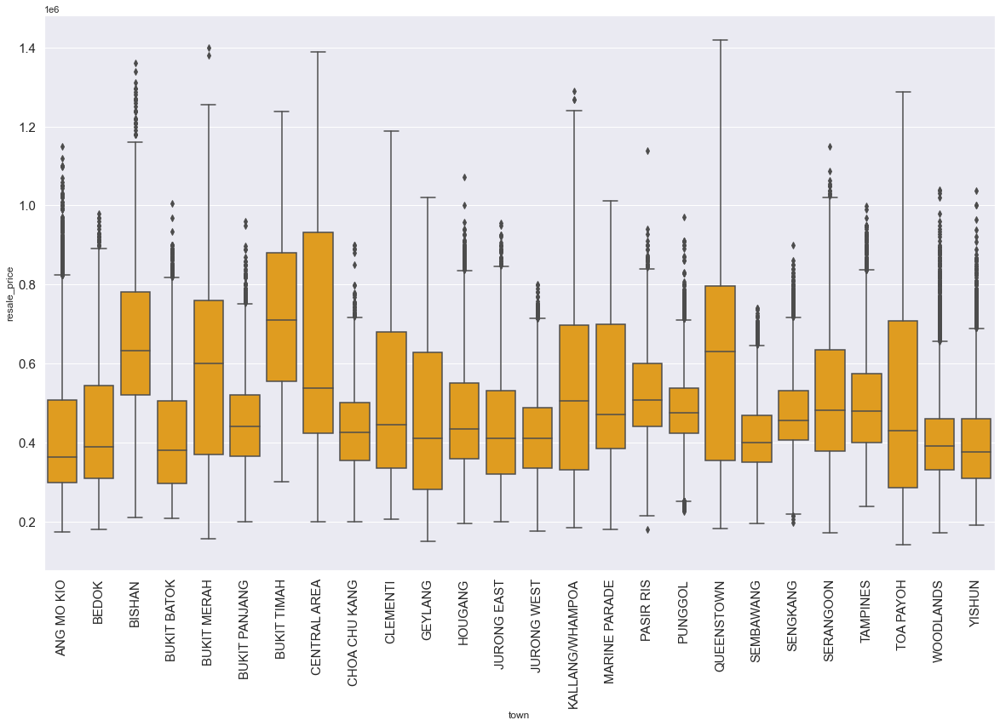

In [30]:
f, axes = plt.subplots(1, 1, figsize=(20, 12))
sb.boxplot(x = 'town', y = 'resale_price', data = ConcatData, color = 'orange')
plt.xticks(rotation = 90)
plt.xticks(fontsize = 15);
plt.yticks(fontsize = 15);

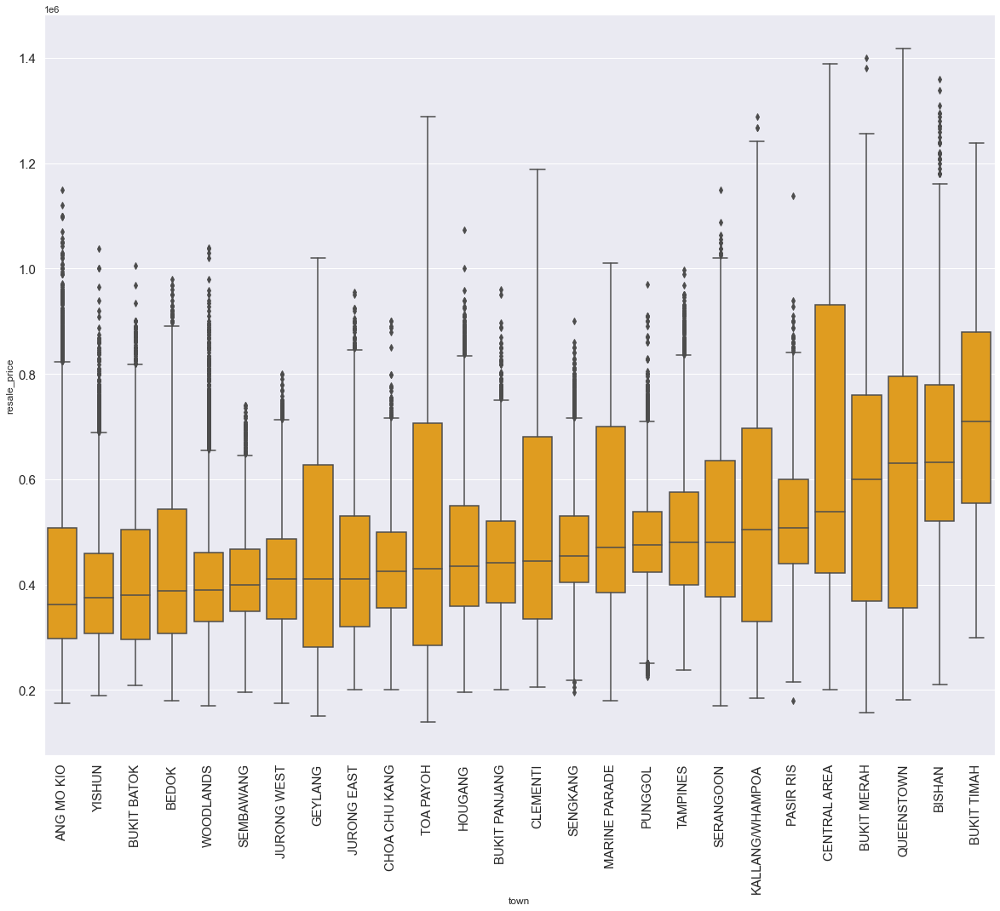

In [31]:
# Rearrange the Town data in increasing trend of median values
new_town = ConcatData.loc[:,['town', 'resale_price']] \
    .groupby(['town']).median() \
    .sort_values(by = 'resale_price')
f = plt.subplots(figsize=(20,16))
sb.boxplot(x = 'town', y ='resale_price', data = ConcatData, order = new_town.index, color="Orange")
plt.xticks(rotation = 90);
plt.xticks(fontsize = 15);
plt.yticks(fontsize = 15);

#### Relationship between Flat Type and Resale Price

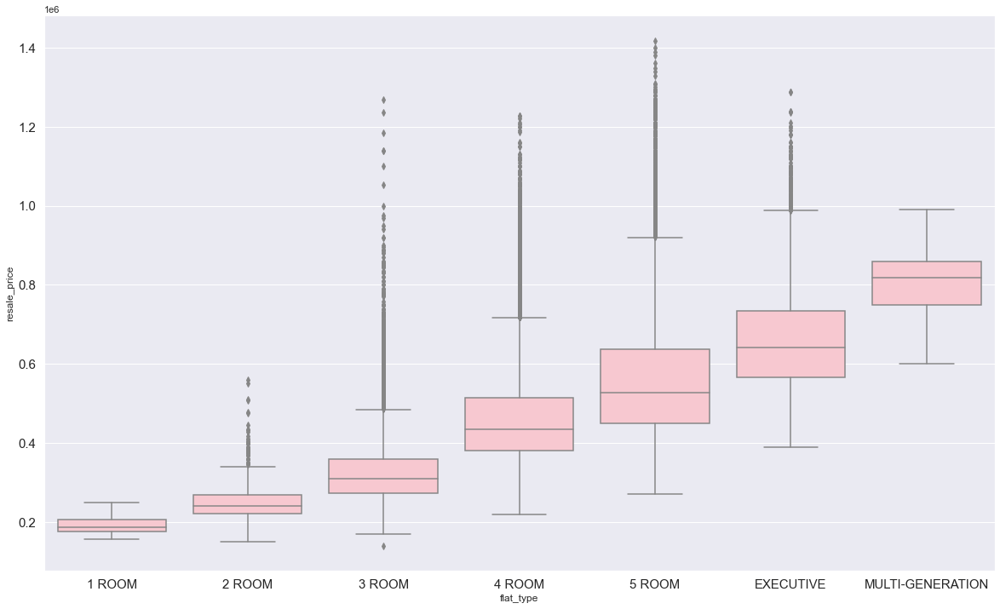

In [32]:
f, axes = plt.subplots(1, 1, figsize=(20, 12))
sb.boxplot(x = 'flat_type', y = 'resale_price', data = ConcatData, color = 'Pink')
plt.xticks(fontsize = 15);
plt.yticks(fontsize = 15);

#### Relationship between Storey Range and Resale Price

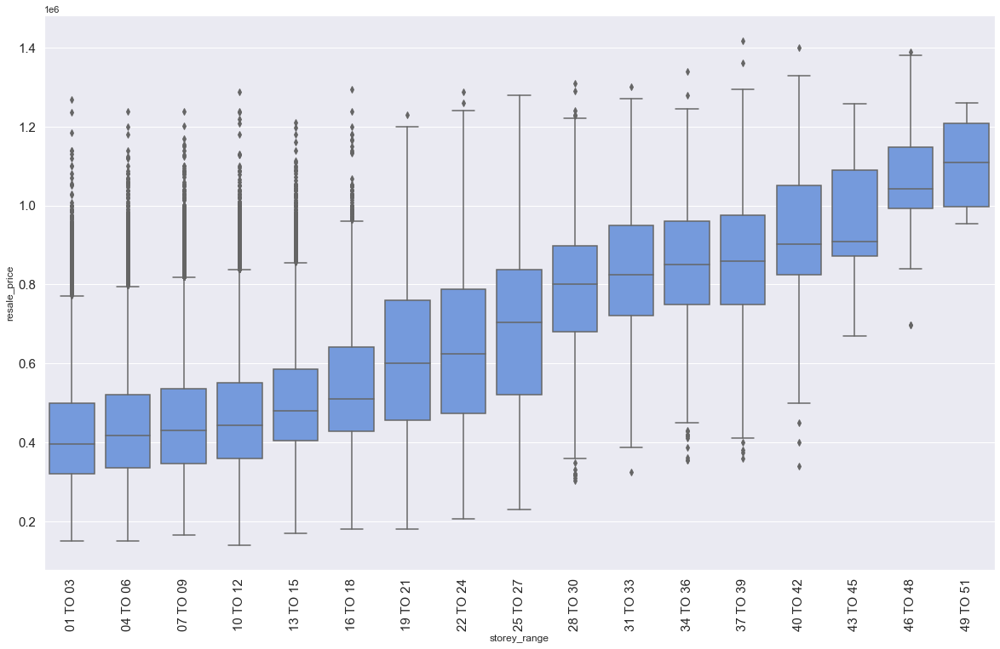

In [33]:
f, axes = plt.subplots(1, 1, figsize=(20,12))
sb.boxplot(x = 'storey_range', y = 'resale_price', data = ConcatData, color = 'CornFlowerBlue')
plt.xticks(rotation = 90);
plt.xticks(fontsize = 15);
plt.yticks(fontsize = 15);

#### Relationship between Flat Model and Resale Price

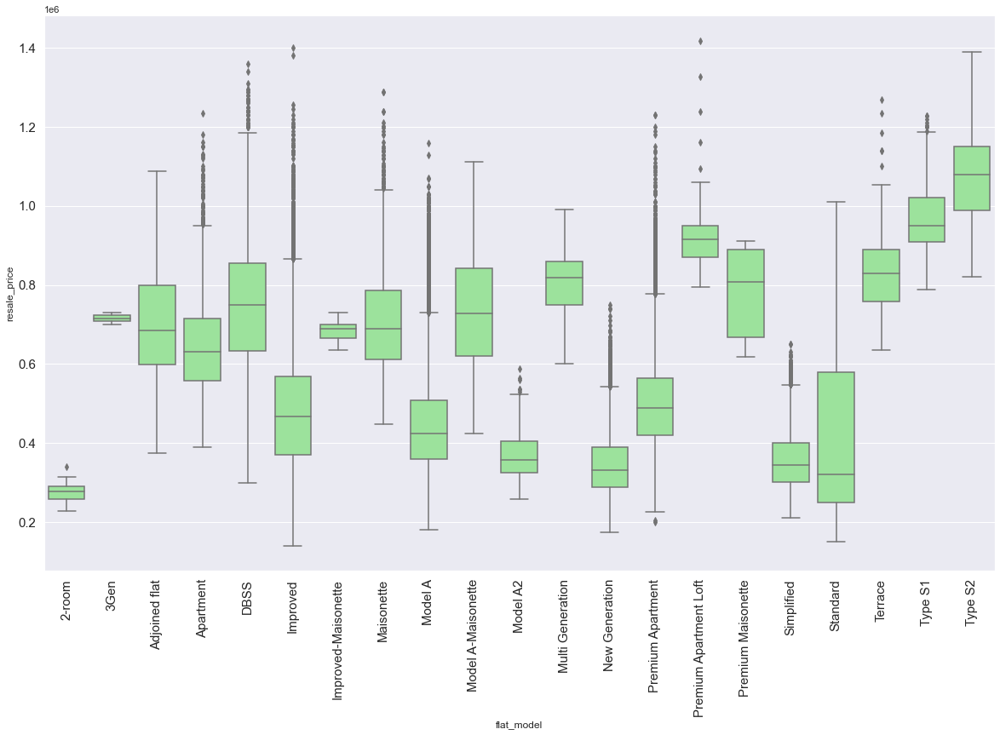

In [34]:
f, axes = plt.subplots(1, 1, figsize=(20, 12))
sb.boxplot(x = 'flat_model', y = 'resale_price', data = ConcatData, color = 'lightgreen')
plt.xticks(rotation = 90)
plt.xticks(fontsize = 15);
plt.yticks(fontsize = 15);

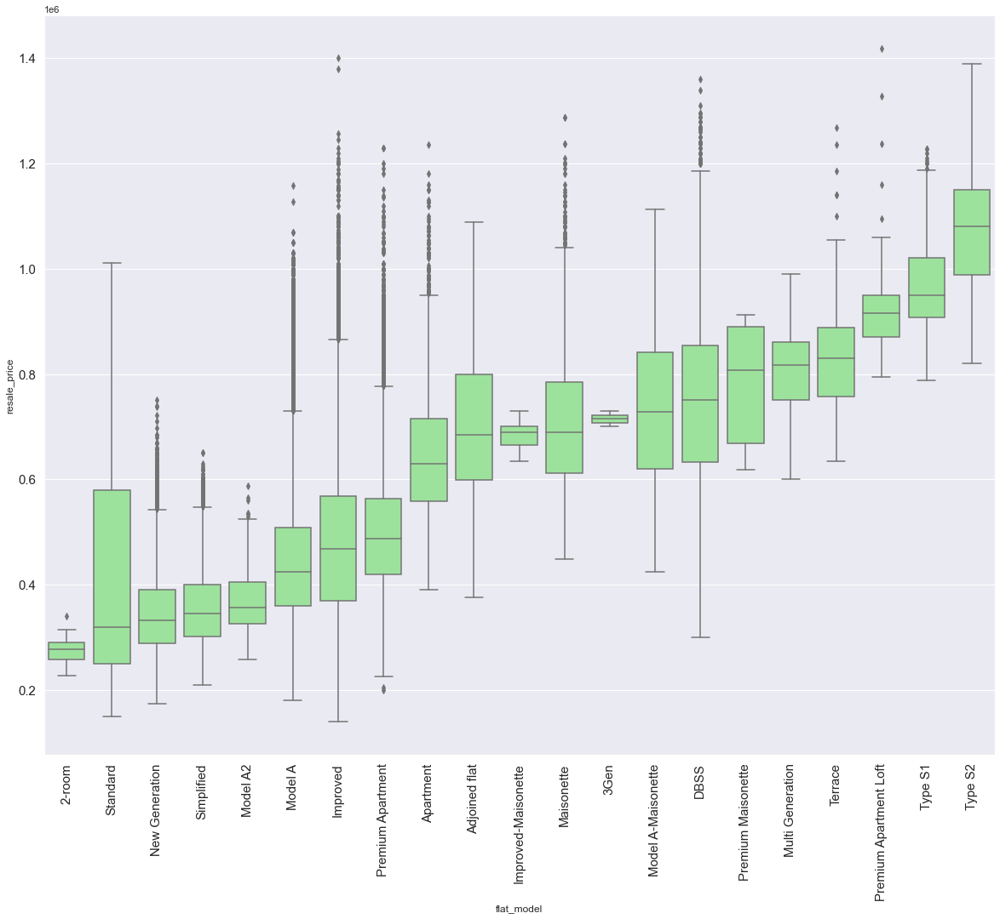

In [35]:
# #Rearrange the flat model data in increasing trend of median values
new_flat_model = ConcatData.loc[:,['flat_model', 'resale_price']] \
    .groupby(['flat_model']).median() \
    .sort_values(by = 'resale_price')

f=plt.subplots(figsize=(20,16))
sb.boxplot(x ='flat_model', y ='resale_price', data = ConcatData, order = new_flat_model.index, color = "lightgreen")
plt.xticks(rotation = 90);
plt.xticks(fontsize = 15);
plt.yticks(fontsize = 15);

**Observation**: 
`Town`,`Flat Type`, `Storey Range`,and `Flat Model`are important variables for the prediction of resale price as there are high variations in the resale price across the levels. The number of outliers shown in the boxplots are significant, therefore, the house resale price will be estimated based on the median resale price of each variable.

---

## Part 3 - Final Analysis of Data

Based on the analysis of numerical and categorical data shown in Part 2 and 3, the variations of each variable are listed. The variables that show high variations across the levels are then used to predict resale flat prices in Singapore. 

| Variable            | Variation               |    
| -------------------:| :---------------------: |        
| town                | High                    |
| flat_type           | High                    |   
| storey_range        | High                    |   
| floor_area_sqm      | High                    |   
| flat_model          | High                    |        
| remaining_lease     | Low                     |                        

In [36]:
#Import Regression model from Scikit-Learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [37]:
# Data used for prediction of resale price
finalData = pd.concat([categoricalData,numericalData],axis = 1)
finalData = finalData.drop(['remaining_lease'],axis = 1)
finalData.head()

,town,flat_type,storey_range,flat_model,floor_area_sqm,resale_price
0,ANG MO KIO,2 ROOM,10 TO 12,Improved,44.0,232000.0
1,ANG MO KIO,3 ROOM,01 TO 03,New Generation,67.0,250000.0
2,ANG MO KIO,3 ROOM,01 TO 03,New Generation,67.0,262000.0
3,ANG MO KIO,3 ROOM,04 TO 06,New Generation,68.0,265000.0
4,ANG MO KIO,3 ROOM,01 TO 03,New Generation,67.0,265000.0


In [38]:
le = LabelEncoder()

finalData['town_le'] = le.fit_transform(finalData['town'])
finalData['flat_type_le'] = le.fit_transform(finalData['flat_type'])
finalData['storey_range_le'] = le.fit_transform(finalData['storey_range'])
finalData['flat_model_le'] = le.fit_transform(finalData['flat_model'])

before_after_finalData = finalData.copy()

finalData = finalData[['town_le', 'flat_type_le', 'storey_range_le', 'flat_model_le', 'floor_area_sqm', 'resale_price']].copy()

finalData.columns = finalData.columns.str.replace('_le', '')

### Multi-Variate Regression

In [39]:
finalData.dtypes

town                int64
flat_type           int64
storey_range        int64
flat_model          int64
floor_area_sqm    float64
resale_price      float64
dtype: object

In [40]:
predictor = pd.DataFrame(finalData[['town','flat_type','storey_range','flat_model', 'floor_area_sqm']])
resalePrice = pd.DataFrame(finalData['resale_price'])

#### Regression Models on Resale Price vs Predictor

In [41]:
# Split the dataset randomly into Train and Test 
predictor_train, predictor_test, resalePrice_train, resalePrice_test = train_test_split(predictor, resalePrice, test_size = 0.20, random_state = 42)

# Check the sample sizes
print("Train Set :", predictor_train.shape, resalePrice_train.shape)
print("Test Set  :", predictor_test.shape, resalePrice_test.shape)

# Create a Linear Regression object
linreg1 = LinearRegression()
linreg2 = GradientBoostingRegressor()
linreg3 = RandomForestRegressor()

# Train the Linear Regression model
linreg1.fit(predictor_train, resalePrice_train)
linreg2.fit(predictor_train, resalePrice_train)
linreg3.fit(predictor_train, resalePrice_train)

Train Set : (107018, 5) (107018, 1)
Test Set  : (26755, 5) (26755, 1)


RandomForestRegressor()

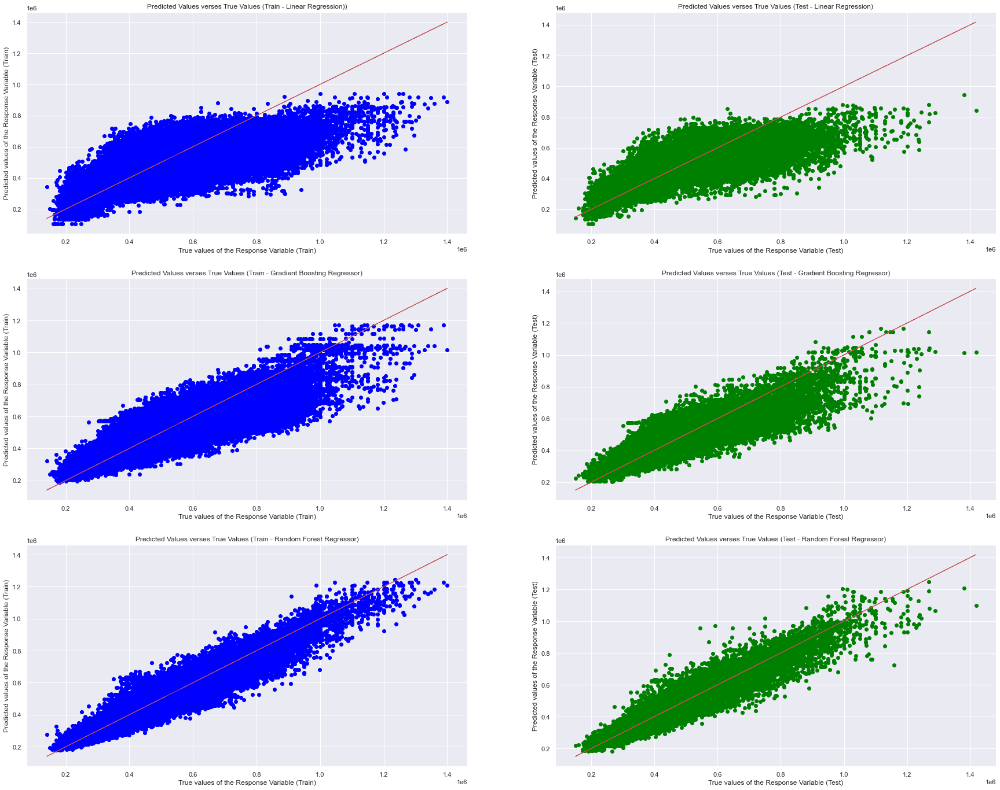

In [42]:
# [Linear Regression] Predict SalePrice values corresponding to the variables
lr_resalePrice_train_pred = linreg1.predict(predictor_train)
lr_resalePrice_test_pred = linreg1.predict(predictor_test)

# [Gradient Boosting Model] Predict SalePrice values corresponding to the variables
gb_resalePrice_train_pred = linreg2.predict(predictor_train)
gb_resalePrice_test_pred = linreg2.predict(predictor_test)

# [Random Forest Regressor Model] Predict SalePrice values corresponding to the variables
rf_resalePrice_train_pred = linreg3.predict(predictor_train)
rf_resalePrice_test_pred = linreg3.predict(predictor_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(3, 2, figsize=(30, 24))
axes[0, 0].scatter(resalePrice_train, lr_resalePrice_train_pred, color = "blue")
axes[0, 0].plot(resalePrice_train, resalePrice_train, 'r-', linewidth = 1)
axes[0, 0].set_title("Predicted Values verses True Values (Train - Linear Regression))")
axes[0, 0].set_xlabel("True values of the Response Variable (Train)")
axes[0, 0].set_ylabel("Predicted values of the Response Variable (Train)")

axes[0, 1].scatter(resalePrice_test, lr_resalePrice_test_pred, color = "green")
axes[0, 1].plot(resalePrice_test, resalePrice_test, 'r-', linewidth = 1)
axes[0, 1].set_title("Predicted Values verses True Values (Test - Linear Regression)")
axes[0, 1].set_xlabel("True values of the Response Variable (Test)")
axes[0, 1].set_ylabel("Predicted values of the Response Variable (Test)")

# Plot the Predictions vs the True values
axes[1,0].scatter(resalePrice_train, gb_resalePrice_train_pred, color = "blue")
axes[1,0].plot(resalePrice_train, resalePrice_train, 'r-', linewidth = 1)
axes[1,0].set_title("Predicted Values verses True Values (Train - Gradient Boosting Regressor)")
axes[1,0].set_xlabel("True values of the Response Variable (Train)")
axes[1,0].set_ylabel("Predicted values of the Response Variable (Train)")

axes[1,1].scatter(resalePrice_test, gb_resalePrice_test_pred, color = "green")
axes[1,1].plot(resalePrice_test, resalePrice_test, 'r-', linewidth = 1)
axes[1,1].set_title("Predicted Values verses True Values (Test - Gradient Boosting Regressor)")
axes[1,1].set_xlabel("True values of the Response Variable (Test)")
axes[1,1].set_ylabel("Predicted values of the Response Variable (Test)")

# Plot the Predictions vs the True values
axes[2,0].scatter(resalePrice_train, rf_resalePrice_train_pred, color = "blue")
axes[2,0].plot(resalePrice_train, resalePrice_train, 'r-', linewidth = 1)
axes[2,0].set_title("Predicted Values verses True Values (Train - Random Forest Regressor)")
axes[2,0].set_xlabel("True values of the Response Variable (Train)")
axes[2,0].set_ylabel("Predicted values of the Response Variable (Train)")

axes[2,1].scatter(resalePrice_test, rf_resalePrice_test_pred, color = "green")
axes[2,1].plot(resalePrice_test, resalePrice_test, 'r-', linewidth = 1)
axes[2,1].set_title("Predicted Values verses True Values (Test - Random Forest Regressor)")
axes[2,1].set_xlabel("True values of the Response Variable (Test)")
axes[2,1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

In [43]:
# Goodness of Fit of Linear Regression Model
R2_train_linear = linreg1.score(predictor_train, resalePrice_train)
R2_test_linear = linreg1.score(predictor_test, resalePrice_test)
print("Explained Variance (R^2) on Train Set \t:", R2_train_linear)
print("Explained Variance (R^2) on Test Set \t:", R2_test_linear)

lr_R2 = pd.DataFrame(data = {'Model': ['Linear Regression'], 'R2 (Train)': [R2_train_linear], 'R2 (Test)': [R2_test_linear]})

Explained Variance (R^2) on Train Set 	: 0.5387744368719691
Explained Variance (R^2) on Test Set 	: 0.540789137190604


In [44]:
lr_R2

,Model,R2 (Train),R2 (Test)
0,Linear Regression,0.538774,0.540789


In [45]:
# Goodness of Fit of GradientBoosting Regression Model
R2_train_linear = linreg2.score(predictor_train, resalePrice_train)
R2_test_linear = linreg2.score(predictor_test, resalePrice_test)
print("Explained Variance (R^2) on Train Set \t:", R2_train_linear)
print("Explained Variance (R^2) on Test Set \t:", R2_test_linear)

gb_R2 = pd.DataFrame(data = {'Model': ['Gradient Boosting Regressor'], 'R2 (Train)': [R2_train_linear], 'R2 (Test)': [R2_test_linear]})

Explained Variance (R^2) on Train Set 	: 0.7638705827328623
Explained Variance (R^2) on Test Set 	: 0.7648278635542056


In [46]:
gb_R2

,Model,R2 (Train),R2 (Test)
0,Gradient Boosting Regressor,0.763871,0.764828


In [47]:
# Goodness of Fit of RandomForest Regression Model
R2_train_linear = linreg3.score(predictor_train, resalePrice_train)
R2_test_linear = linreg3.score(predictor_test, resalePrice_test)
print("Explained Variance (R^2) on Train Set \t:", R2_train_linear)
print("Explained Variance (R^2) on Test Set \t:", R2_test_linear)

rf_R2 = pd.DataFrame(data = {'Model': ['Random Forest Regressor'], 'R2 (Train)': [R2_train_linear], 'R2 (Test)': [R2_test_linear]})

Explained Variance (R^2) on Train Set 	: 0.9165083030242119
Explained Variance (R^2) on Test Set 	: 0.8929332120249955


In [48]:
rf_R2

,Model,R2 (Train),R2 (Test)
0,Random Forest Regressor,0.916508,0.892933


In [49]:
final_R2 = pd.concat([lr_R2, gb_R2, rf_R2]).reset_index(drop = True)

In [50]:
final_R2

,Model,R2 (Train),R2 (Test)
0,Linear Regression,0.538774,0.540789
1,Gradient Boosting Regressor,0.763871,0.764828
2,Random Forest Regressor,0.916508,0.892933


---

## Part 4 - Mathematical Model

In [51]:
# Arrange town data alphabetically in ascending order
Town = before_after_finalData[['town','town_le']].copy()
Town.drop_duplicates(subset=['town'], inplace = True)    
Town.sort_values('town', inplace = True)
Town.reset_index(drop = True, inplace = True)
Town.head()

,town,town_le
0,ANG MO KIO,0
1,BEDOK,1
2,BISHAN,2
3,BUKIT BATOK,3
4,BUKIT MERAH,4


In [52]:
# Arrange Flat Type data in ascending order
FlatType = before_after_finalData[['flat_type','flat_type_le']].copy()
FlatType.drop_duplicates(subset=['flat_type'], inplace = True)    
FlatType.sort_values('flat_type', inplace = True)
FlatType.reset_index(drop = True, inplace = True)
FlatType.head()

,flat_type,flat_type_le
0,1 ROOM,0
1,2 ROOM,1
2,3 ROOM,2
3,4 ROOM,3
4,5 ROOM,4


In [53]:
# Arrange Storey Range data in ascending order
StoreyRange = before_after_finalData[['storey_range','storey_range_le']].copy()
StoreyRange.drop_duplicates(subset=['storey_range'], inplace = True)    
StoreyRange.sort_values('storey_range', inplace = True)
StoreyRange.reset_index(drop = True, inplace = True)
StoreyRange.head()

,storey_range,storey_range_le
0,01 TO 03,0
1,04 TO 06,1
2,07 TO 09,2
3,10 TO 12,3
4,13 TO 15,4


In [54]:
# Arrange Flat Model data in ascending order
FlatModel = before_after_finalData[['flat_model','flat_model_le']].copy()
FlatModel.drop_duplicates(subset=['flat_model'], inplace = True)    
FlatModel.sort_values('flat_model', inplace = True)
FlatModel.reset_index(drop = True, inplace = True)
FlatModel.head()

,flat_model,flat_model_le
0,2-room,0
1,3Gen,1
2,Adjoined flat,2
3,Apartment,3
4,DBSS,4


In [55]:
def pricing_model(town, flat_type, storey_range, flat_model, floor_area):
    
    town = town
    flat_type = flat_type
    storey_range = storey_range
    flat_model = flat_model
    floor_area = floor_area
        
    town = Town.loc[Town['town'] == town].town_le.values[0]   # extract the median price using iloc

    flat_type = FlatType.loc[FlatType['flat_type'] == flat_type].flat_type_le.values[0] 

    storey_range = StoreyRange.loc[StoreyRange['storey_range'] == storey_range].storey_range_le.values[0] 

    flat_model = FlatModel.loc[FlatModel['flat_model'] == flat_model].flat_model_le.values[0] 

    x = pd.DataFrame([[town,flat_type,storey_range,flat_model,floor_area]])
    resale_price = linreg3.predict(x)

    print("The Predicted Resale Price: {}".format(resale_price[0]))

In [56]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

@interact

def show_pricing_model(
    
    town = widgets.Dropdown(
    options=sorted(list(before_after_finalData.town.unique())),
    value=list(before_after_finalData.town.unique())[0],
    description='Town:',
    disabled=False,
    ), 
    
    flat_type = widgets.Dropdown(
    options=sorted(list(before_after_finalData.flat_type.unique())),
    value=sorted(list(before_after_finalData.flat_type.unique()))[0],
    description='Flat Type:',
    disabled=False,
    ), 
    
    storey_range = widgets.Dropdown(
    options=sorted(list(before_after_finalData.storey_range.unique())),
    value=sorted(list(before_after_finalData.storey_range.unique()))[0],
    description='Storey Range:',
    disabled=False,
    ), 
    
    flat_model = widgets.Dropdown(
    options=sorted(list(before_after_finalData.flat_model.unique())),
    value=sorted(list(before_after_finalData.flat_model.unique()))[0],
    description='Flat Model:',
    disabled=False,
    ), 
    
    
    floor_area_sqm = widgets.BoundedFloatText(
    value=40,
    min=0,
    max=1000,
    step=0.1,
    description='Floor Area sqm:',
    disabled=False)):

    return pricing_model(town, flat_type, storey_range, flat_model, floor_area_sqm)

interactive(children=(Dropdown(description='Town:', options=('ANG MO KIO', 'BEDOK', 'BISHAN', 'BUKIT BATOK', '…